<a href="https://colab.research.google.com/github/francotestori/aauba_01/blob/master/version_reducida_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Aprendizaje Automático

El objetivo de este trabajo práctico es el desarrollo de una solución que permita predecir la cancelación de una reserva utilizando como dataset el archivo provisto por la catedra ***'hotel_bookins.csv'***.

In [8]:
# Cargar el archivo original de bookings
!wget https://raw.githubusercontent.com/francotestori/aauba_01/master/resources/hotel_bookings.csv

--2020-06-16 13:10:10--  https://raw.githubusercontent.com/francotestori/aauba_01/master/resources/hotel_bookings.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16855599 (16M) [text/plain]
Saving to: ‘hotel_bookings.csv.1’

hotel_bookings.csv. 100%[===================>]  16.07M  29.8MB/s    in 0.5s    

2020-06-16 13:10:11 (29.8 MB/s) - ‘hotel_bookings.csv.1’ saved [16855599/16855599]



In [9]:
!pip install info_gain
from info_gain import info_gain
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from datetime import date, datetime
from sklearn import tree
from sklearn.tree import plot_tree
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

In [0]:
pd.set_option('display.max_columns', 60)
pd.set_option('display.max_rows', 500)
pd.set_option('display.width', 10000)

bookings_df = pd.read_csv('hotel_bookings.csv')

## a. División en grupos y cuantificación de categorías

---

In [11]:
columnas_categoricas = [
  'hotel', 
  'is_canceled', 
  'meal', 
  'country', 
  'market_segment', 
  'distribution_channel', 
  'is_repeated_guest', 
  'deposit_type', 
  'agent', 
  'company', 
  'customer_type', 
  'reservation_status',
  'arrival_date_month'
]
df_categoricas = bookings_df[columnas_categoricas]

columnas_numericas = [
    'lead_time',  
    'stays_in_weekend_nights', 
    'stays_in_week_nights', 
    'adults', 
    'children', 
    'babies', 
    'previous_cancellations', 
    'previous_bookings_not_canceled', 
    'booking_changes', 
    'days_in_waiting_list', 
    'adr', 
    'required_car_parking_spaces', 
    'total_of_special_requests'                      
]
df_numericas = bookings_df[columnas_numericas]

columnas_ordinales = [
       'reserved_room_type', 
       'assigned_room_type'               
]
df_ordinales = bookings_df[columnas_ordinales]
df_ordinales

def get_month_number(month):
  if month == "January":
    return 1
  elif month == "February":
    return 2   
  elif month == "March":
    return 3   
  elif month == "April":
    return 4   
  elif month == "May":
    return 5   
  elif month == "June":
    return 6   
  elif month == "July":
    return 7   
  elif month == "August":
    return 8   
  elif month == "September":
    return 9   
  elif month == "October":
    return 10
  elif month == "November":
    return 11   
  elif month == "December":
    return 12
  else:
    return 0     

def checkin(year, month_str, day):
  month = get_month_number(month_str)
  return date(year, month, day)

columnas_fecha_hora = [
  'arrival_date_month', 
  'arrival_date_year',
  'arrival_date_day_of_month',   
  'reservation_status_date'               
]
df_fecha_hora = bookings_df[columnas_fecha_hora]
df_fecha_hora['checkin_date'] = df_fecha_hora.apply(
    lambda x: checkin(x['arrival_date_year'], x['arrival_date_month'], x['arrival_date_day_of_month']),
    axis=1
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


## b. Valores faltantes

In [12]:
import numpy as np

df=bookings_df

for col in df.columns:
    if df[col].dtype == 'object' and col != 'country':
        df.loc[df[col].str.contains('NULL'), col] = np.nan
        df.loc[df[col].str.contains('Undefined', na=False), col] = np.nan

null_series = df.isnull().sum()

print(null_series[null_series > 0])

children                     4
meal                      1169
country                    488
market_segment               2
distribution_channel         5
agent                    16340
company                 112593
dtype: int64


In [0]:

# Haciendo un análisis inicial contamos con faltantes en los siguientes atributos:
# * **children**: Son muy pocos casos, 4. 
# * **country**: Pocos casos sería posible con alguna medida de cercanía.
# * **agent**: Relativamente grande número de faltantes, 15%.
# * **company**: Número demasiado grande de faltantes, aprox 90%.

# Sin embargo, conocemos que hay otros campos que podrian poseer valores que analogamente representan un valor nulo. 
# Por lo que para esos imputaremos las modas

# Relleno por el valor mas frecuente (moda)
bookings_df['meal'].fillna("BB", inplace = True)
bookings_df['children'].fillna(0.0, inplace = True)
bookings_df['market_segment'].fillna('Online TA', inplace = True)
bookings_df['distribution_channel'].fillna('TA/TO', inplace = True)

# Asigno un desconocido
bookings_df['country'].fillna('XXX', inplace = True)

# Utilizo un valor dummy (máscara) para la presencia de agent y company
bookings_df['agent'] = bookings_df['agent'].isnull()
bookings_df['company'] = bookings_df['company'].isnull()

In [17]:
original_nulls = bookings_df.isnull().sum()

print(original_nulls)

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
company                           0
days_in_waiting_list              0
customer_type                     0
adr                         

## c. Análisis de duplicados

Vamos a analizar si hay reservas duplicadas en nuestro dataframe

In [19]:
duplicated = bookings_df[bookings_df.duplicated()]

# Analizamos el porcentaje de duplicados en base a nuestra muestra
duplicated_ratio = len(duplicated)/len(bookings_df)
print(duplicated_ratio)

# Por elementos **duplicados** entendemos que todas las features de dos filas son identicos.

# Entonces sospechabamos que podría haber casos de una misma reserva que se referenciaba 2 o mas veces en nuestro dataframe.

# Sin embargo y evaluando el peso de los duplicados en nuestro dataframe (26%), entendemos simplemente que son reservas distintas pero con las mismas características.

0.26812128318954687


## c. Variables correlacionadas


In [20]:
corr = bookings_df.corr()
abs(corr.iloc[0,]).sort_values(ascending=False)

# Las cuatro variables más correlacionadas son:

# * **lead_time**                      0.293123
# * **total_of_special_requests**      0.234658
# * **required_car_parking_spaces**    0.195498
# * **booking_changes**                0.144381

is_canceled                       1.000000
lead_time                         0.293123
total_of_special_requests         0.234658
required_car_parking_spaces       0.195498
booking_changes                   0.144381
previous_cancellations            0.110133
agent                             0.102068
company                           0.099310
is_repeated_guest                 0.084793
adults                            0.060017
previous_bookings_not_canceled    0.057358
days_in_waiting_list              0.054186
adr                               0.047557
babies                            0.032491
stays_in_week_nights              0.024765
arrival_date_year                 0.016660
arrival_date_week_number          0.008148
arrival_date_day_of_month         0.006130
children                          0.005036
stays_in_weekend_nights           0.001791
Name: is_canceled, dtype: float64

In [21]:
# PUNTO DE DUDA: CÓMO ELEGIMOS LAS CUATRO MÁS CORRELACIONADAS

# Más allá de la forma, transformamos las variables para que quede un dataset con todas variables en números

# FUNCIONES AUXILIARES
def quantify_room_type(room_type):
    if room_type == 'A':
        return 1
    elif room_type == 'B':
        return 2
    elif room_type == 'C':
        return 3
    elif room_type == 'D':
        return 4
    elif room_type == 'E':
        return 5
    elif room_type == 'F':
        return 6
    elif room_type == 'G':
        return 7
    elif room_type == 'H':
        return 8
    elif room_type == 'I':
        return 9
    elif room_type == 'K':
        return 10
    elif room_type == 'L':
        return 11
    elif room_type == 'P':
        return 12
    else:
        return 0

def room_matches(this_room, other_room):
  match = this_room.lower().replace('s/+',"") == other_room.lower().replace('s/+',"")
  if(match):
    return 1
  else:
    return 0

# CATEGÓRICAS

df_categoricas = bookings_df[columnas_categoricas]

min_dummy = len(df_categoricas)*0.005  # Mínimo de frecuencia para incluir la columna: 0.5% del total
df_categoricas['has_agent'] = bookings_df['agent'].astype(int)
df_categoricas['has_company'] = bookings_df['company'].astype(int)
dummies_cat = pd.get_dummies(
    df_categoricas, 
    columns=[
      'hotel',       
      'market_segment', 
      'meal', 
      'is_repeated_guest', 
      'deposit_type', 
      'customer_type',
      'country',
      'arrival_date_month'
    ], 
    drop_first=False
)
dummies_cat = dummies_cat.iloc[:, 8:]
corr_cat = dummies_cat[dummies_cat.columns[dummies_cat.sum()>min_dummy]]

# ORDINALES
columnas_ordinales = [
       'reserved_room_type', 
       'assigned_room_type'               
]
df_ordinales = bookings_df[columnas_ordinales]
df_ordinales['assigned_room_vl'] = df_ordinales.apply(lambda x: quantify_room_type(x['assigned_room_type']), axis=1)
df_ordinales['requested_room_vl'] = df_ordinales.apply(lambda x: quantify_room_type(x['reserved_room_type']), axis=1)
corr_cat['did_room_match'] = df_ordinales.apply(lambda x: room_matches(x['reserved_room_type'],x['assigned_room_type']), axis=1)
corr_cat['booker_room_gain'] = df_ordinales.apply(lambda x: x['assigned_room_vl'] - x['requested_room_vl'], axis=1)
corr_ord = df_ordinales[['assigned_room_vl', 'requested_room_vl']]

# NUMERICAS
columnas_numericas = [
    'lead_time',  
    'stays_in_week_nights', 
    'stays_in_weekend_nights', 
    'adults', 
    'children', 
    'babies', 
    'previous_cancellations', 
    'previous_bookings_not_canceled',     
    'days_in_waiting_list', 
    'adr', 
    'required_car_parking_spaces', 
    'total_of_special_requests'                      
]
df_numericas = bookings_df[columnas_numericas]

corr_num = df_numericas

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

In [0]:
# UNION
df_correlations = pd.concat([corr_num,corr_ord,corr_cat],axis=1) 
df_correlations.loc[:,'is_canceled'] = df_categoricas['is_canceled'] 

# El dataset df_correlations restante luego de nuestras transformaciones (encodings)
# termina teniendo todos sus atributos numéricos
# DEBERIAMOS UTILIZARLO EN ADELANTE PARA EL ARMADO DEL ARBOL (?)

In [23]:
corr = df_correlations[df_correlations.columns].corr()['is_canceled'][:-1] 
abs(corr).sort_values(ascending=False)
# RESTARÍA DEFINIR CÓMO ELEGIMOS LAS CUATRO MÁS CORRELACIONADAS, 
# QUE SERÁ EN FUNCIÓN DE LO QUE DEFINIMOS PARA LAS CORRELACIONES

deposit_type_Non Refund           0.481457
deposit_type_No Deposit           0.477911
country_PRT                       0.336122
lead_time                         0.293123
did_room_match                    0.247770
total_of_special_requests         0.234658
market_segment_Groups             0.221859
booker_room_gain                  0.205484
required_car_parking_spaces       0.195498
assigned_room_vl                  0.176028
market_segment_Direct             0.154390
hotel_Resort Hotel                0.136531
customer_type_Transient           0.133084
customer_type_Transient-Party     0.124135
country_FRA                       0.118254
country_GBR                       0.117106
previous_cancellations            0.110133
country_DEU                       0.107316
is_repeated_guest_0               0.084793
is_repeated_guest_1               0.084793
market_segment_Corporate          0.081667
country_ESP                       0.066981
requested_room_vl                 0.061077
adults     

In [0]:
#Defino función cramer's corrected, para categóricas
import scipy.stats as ss
import numpy as np

def cramers_corrected_stat(confusion_matrix):
    """ calculate Cramers V statistic for categorial-categorial association.
        uses correction from Bergsma and Wicher, 
        Journal of the Korean Statistical Society 42 (2013): 323-328
    """
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))

In [25]:
#Calculo las correlaciones para las categóricas
corr_cat2 = pd.DataFrame(columns=['Atributo', 'Cramers_V_corrected'])

for i in range(len(corr_cat.columns)):
  feature= corr_cat.columns[i]
  confusion_matrix = pd.crosstab(df_categoricas['is_canceled'],corr_cat.iloc[:,i])
  coefficient = cramers_corrected_stat(confusion_matrix)
  corr_cat2.loc[i] = [feature] + [coefficient]

corr_cat2.sort_values('Cramers_V_corrected',ascending=False)

,Atributo,Cramers_V_corrected
14,deposit_type_Non Refund,0.481424
13,deposit_type_No Deposit,0.477878
34,country_PRT,0.336093
51,booker_room_gain,0.248016
50,did_room_match,0.247728
4,market_segment_Groups,0.221818
3,market_segment_Direct,0.154335
0,hotel_Resort Hotel,0.136483
16,customer_type_Transient,0.133033
17,customer_type_Transient-Party,0.124080


In [26]:
#Point Biserial para las categóricas
corr_num2 = pd.DataFrame(columns=['Atributo', 'Point_Biserial'])

for i in range(len(df_numericas.columns)):
  feature2= df_numericas.columns[i]
  coefficient2 = ss.pointbiserialr(df_categoricas['is_canceled'],df_numericas.iloc[:,i])[0]
  corr_num2.loc[i] = [feature2] + [coefficient2]

corr_num2.sort_values('Point_Biserial',ascending=False)

,Atributo,Point_Biserial
0,lead_time,0.293123
6,previous_cancellations,0.110133
3,adults,0.060017
8,days_in_waiting_list,0.054186
9,adr,0.047557
1,stays_in_week_nights,0.024765
4,children,0.005036
2,stays_in_weekend_nights,-0.001791
5,babies,-0.032491
7,previous_bookings_not_canceled,-0.057358


In [27]:
#Correlaciones ordinales
corr_ord2 = pd.DataFrame(columns=['Atributo', 'Spearman'])

for i in range(len(corr_ord.columns)):
  feature3 = corr_ord.columns[i]
  coefficient3 = ss.spearmanr(df_categoricas['is_canceled'],corr_ord.iloc[:,i])[0]
  corr_ord2.loc[i] = [feature3] + [coefficient3]

corr_ord2.sort_values('Spearman',ascending=False)

,Atributo,Spearman
1,requested_room_vl,-0.067462
0,assigned_room_vl,-0.188455


In [28]:
#Unión de las correlaciones
o1 = corr_ord2 
o1.columns=['Atributo', 'Correlacion']
n1 = corr_num2 
n1.columns=['Atributo', 'Correlacion']
c1 = corr_cat2 
c1.columns=['Atributo', 'Correlacion']
correlaciones= o1.append(n1.append(c1))
correlaciones['Abs(Cor)']=abs(correlaciones['Correlacion'])
correlaciones.sort_values('Abs(Cor)', ascending=False)

,Atributo,Correlacion,Abs(Cor)
14,deposit_type_Non Refund,0.481424,0.481424
13,deposit_type_No Deposit,0.477878,0.477878
34,country_PRT,0.336093,0.336093
0,lead_time,0.293123,0.293123
51,booker_room_gain,0.248016,0.248016
50,did_room_match,0.247728,0.247728
11,total_of_special_requests,-0.234658,0.234658
4,market_segment_Groups,0.221818,0.221818
10,required_car_parking_spaces,-0.195498,0.195498
0,assigned_room_vl,-0.188455,0.188455


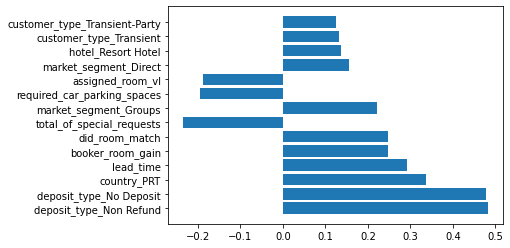

In [32]:
sortedCorr = correlaciones.sort_values('Abs(Cor)', ascending=False)[0:14]
corr = sortedCorr.Atributo
vals = sortedCorr.Correlacion
y_pos = np.arange(len(vals))
plt.barh(y_pos, vals)
plt.yticks(y_pos, corr)
plt.show()


## e. Se encuentra balanceado el set

In [33]:
# Buscamos conocer que tan balanceado está nuestro dataset
bookings_df['is_canceled'].value_counts(normalize=True)

0    0.629584
1    0.370416
Name: is_canceled, dtype: float64

In [34]:
df_correlations['is_canceled'].value_counts(normalize=True)

0    0.629584
1    0.370416
Name: is_canceled, dtype: float64

## g. Implementación Árbol de Decisión

### 1) Arbol de decisión

In [0]:
from sklearn.metrics import fbeta_score

# Con sklearn podemos dividir nuestros datos en conjuntos de entrenamiento, validación y prueba.
# Para el análisis deberiamos utilizar un DF con las variables dummies cargadas
features =  df_correlations.loc[:, df_correlations.columns != 'is_canceled'].columns
target = 'is_canceled'

# Armamos set de datos de dev (0.8) y test (0.2)
x_dev, x_test, y_dev, y_test = train_test_split(
    df_correlations[features].values, 
    df_correlations[target].values, 
    test_size=0.2, 
    random_state=42,
    stratify=df_correlations[target].values
)                           

n_seeds = 50
accs = []
precisions = []
recalls = []
f1s = []
f1s_two = []

for seed in range(n_seeds):
  # Tree Classifier
  arbol_sklearn = DecisionTreeClassifier()

  # División train-validation
  # x_dev y y_dev son el 80% de mi partición anterior
  # x_train y y_train el 80% de esta partición (0.64)
  # x_val_ y y_val el 20% de esta partición (0.16)
  x_train, x_val, y_train, y_val = train_test_split(
      x_dev, 
      y_dev, 
      test_size=0.2, 
      random_state=seed,
      stratify=y_dev
  ) 

  # Entrenamos al arbol
  arbol_sklearn.fit(x_train,y_train)

  # Ejecutamos nuestra predicción
  y_pred_val = arbol_sklearn.predict(x_val)

  # Medimos (accuracy, precision, recall y f-scores) de nuestra predicción
  accs.append(
      accuracy_score(y_val,y_pred_val)
  )
  precisions.append(
      precision_score(y_val,y_pred_val)
  )
  recalls.append(
      recall_score(y_val,y_pred_val)
  )
  f1s.append(
      f1_score(y_val,y_pred_val)
  )
  f1s_two.append(
      fbeta_score(y_val, y_pred_val, beta=2)
  )

metric_labels = ['Accuracy']*len(accs) + ['Precision']*len(precisions) + ['Recall']*len(recalls) + ['F1 Score']*len(f1s) + ['F2 Score']*len(f1s_two)
all_metrics = accs + precisions + recalls + f1s + f1s_two

wanted_metric_labels = ['Precision']*len(precisions) + ['Recall']*len(recalls) + ['F2 Score']*len(f1s_two)
wanted_metrics = precisions + recalls + f1s_two


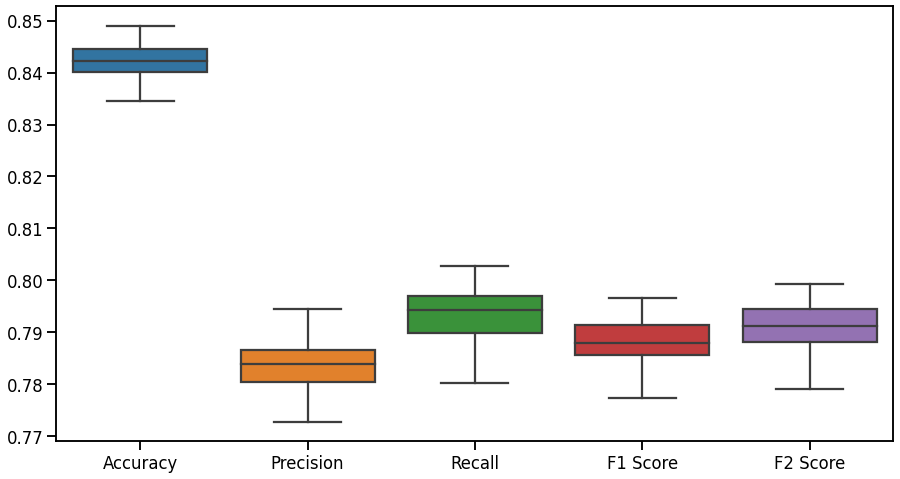

In [79]:
# Boxplots de Métricas
sns.set_context('talk')
plt.figure(figsize=(15,8))
sns.boxplot(metric_labels,all_metrics)

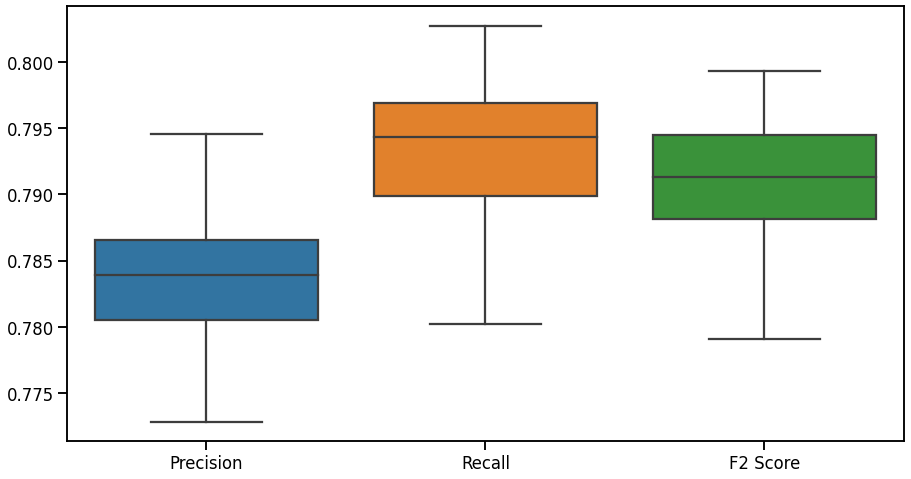

In [80]:
# Boxplots de Métricas Buscadas
sns.set_context('talk')
plt.figure(figsize=(15,8))
sns.boxplot(wanted_metric_labels,wanted_metrics)

### 2) K-fold cross validation

In [0]:
from sklearn.model_selection import StratifiedKFold, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import fbeta_score
import numpy as np

kfold_accs = []
kfold_precisions = []
kfold_recalls = []
kfold_f1s = []
kfold_f1s_two = []

kfoldcv = StratifiedKFold(n_splits=50)

for train_index, test_index in kfoldcv.split(x_dev, y_dev):
  x_train, x_val = x_dev[train_index], x_dev[test_index]
  y_train, y_val = y_dev[train_index], y_dev[test_index]

  # Tree Classifier
  kfold_tree = DecisionTreeClassifier()

  # Entrenamos al arbol
  kfold_tree.fit(x_train,y_train)

  # Ejecutamos nuestra predicción
  y_pred_val = kfold_tree.predict(x_val)

  # Medimos (accuracy, precision, recall y f-scores) de nuestra predicción
  kfold_accs.append(
      accuracy_score(y_val,y_pred_val)
  )
  kfold_precisions.append(
      precision_score(y_val,y_pred_val)
  )
  kfold_recalls.append(
      recall_score(y_val,y_pred_val)
  )
  kfold_f1s.append(
      f1_score(y_val,y_pred_val)
  )
  kfold_f1s_two.append(
      fbeta_score(y_val, y_pred_val, beta=2)
  )

kfold_metric_labels = ['Accuracy']*len(kfold_accs) + ['Precision']*len(kfold_precisions) + ['Recall']*len(kfold_recalls) + ['F1 Score']*len(kfold_f1s) + ['F2 Score']*len(kfold_f1s_two)
kfold_all_metrics = kfold_accs + kfold_precisions + kfold_recalls + kfold_f1s + kfold_f1s_two

kfold_wanted_metric_labels = ['Precision']*len(kfold_precisions) + ['Recall']*len(kfold_recalls) + ['F2 Score']*len(kfold_f1s_two)
kfold_wanted_metrics = kfold_precisions + kfold_recalls + kfold_f1s_two


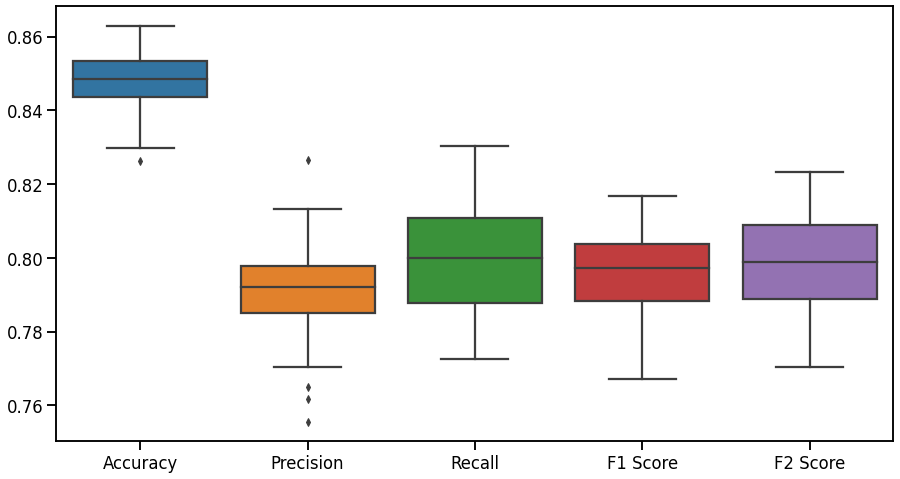

In [87]:
# Boxplots de Métricas
sns.set_context('talk')
plt.figure(figsize=(15,8))
sns.boxplot(kfold_metric_labels,kfold_all_metrics)

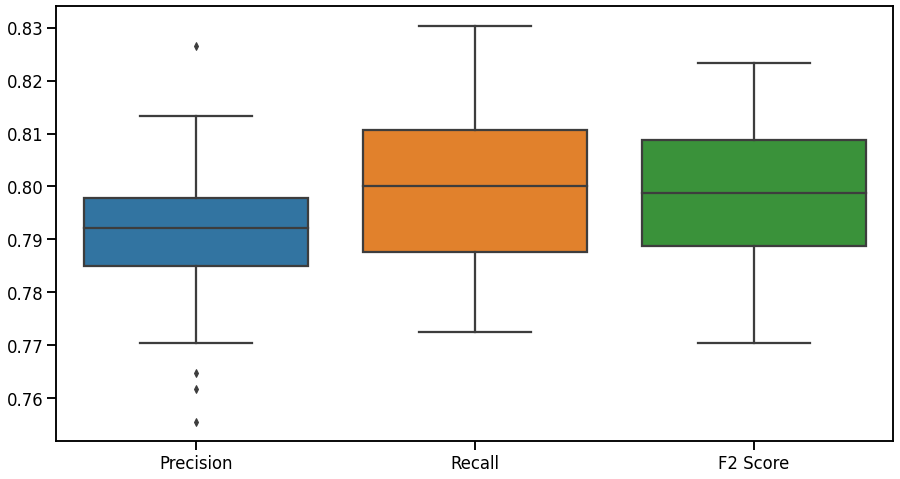

In [88]:
# Boxplots de Métricas Buscadas
sns.set_context('talk')
plt.figure(figsize=(15,8))
sns.boxplot(kfold_wanted_metric_labels,kfold_wanted_metrics)

## h. Graficar Best Tree


In [0]:
best_tree = None
best_score = None

for train_index, test_index in kfoldcv.split(x_dev, y_dev):
  x_train, x_val = x_dev[train_index], x_dev[test_index]
  y_train, y_val = y_dev[train_index], y_dev[test_index]

  # Tree Classifier
  kfold_tree = DecisionTreeClassifier()

  # Entrenamos al arbol
  kfold_tree.fit(x_train,y_train)

  # Ejecutamos nuestra predicción
  y_pred_val = kfold_tree.predict(x_val)

  f2score = fbeta_score(y_val, y_pred_val, beta=2)

  if best_score is None or best_score < f2score:
    best_score = f2score
    best_tree = kfold_tree



dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0808206 to fit



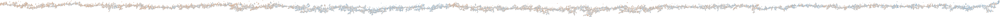

In [90]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(
    best_tree, 
    out_file=dot_data,  
    filled=True, 
    rounded=True,
    special_characters=True
)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [91]:
# Podemos pedir el árbol correspondiente ya entrenado y ver cuán importante es cada atributo
feat_imps = best_tree.feature_importances_
feat_imps

array([0.14107745, 0.03686167, 0.02410681, 0.01453986, 0.00523373,
       0.00085913, 0.01741853, 0.00405118, 0.00147702, 0.10584331,
       0.02589206, 0.05288359, 0.01016262, 0.00938816, 0.00977328,
       0.00042977, 0.00175864, 0.00499045, 0.00200001, 0.00298059,
       0.06039132, 0.0042926 , 0.00028254, 0.00503327, 0.00389926,
       0.00070189, 0.0005264 , 0.00026271, 0.23545577, 0.00075388,
       0.01197872, 0.00611652, 0.00156096, 0.00302771, 0.00329252,
       0.00228188, 0.00223227, 0.00140275, 0.00659695, 0.00351992,
       0.00549417, 0.00514704, 0.00276866, 0.0007097 , 0.00471372,
       0.00229091, 0.00090277, 0.0014471 , 0.04161134, 0.00154564,
       0.00134485, 0.00236239, 0.00550288, 0.00713547, 0.00454763,
       0.00541379, 0.00387872, 0.00670568, 0.00690236, 0.00566006,
       0.00682045, 0.00359334, 0.00589023, 0.0061188 , 0.03444931,
       0.00170524])

In [92]:
# Vemos a que variables corresponden los atributos mas importantes
for feat_imp,feat in sorted(zip(feat_imps,features)):
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

deposit_type_No Deposit: 0.0002627107402134699
meal_FB: 0.000282535845452086
market_segment_Complementary: 0.00042976904751985105
is_repeated_guest_1: 0.0005263974974229767
is_repeated_guest_0: 0.0007018889971460033
country_ISR: 0.0007097044108837608
customer_type_Contract: 0.0007538809440991244
babies: 0.0008591325071987935
country_NOR: 0.0009027699966424546
country_SWE: 0.0013448483718514626
country_CN: 0.001402751877574969
country_POL: 0.0014471040689110538
days_in_waiting_list: 0.0014770162310931358
country_RUS: 0.0015456432151117196
country_AUT: 0.0015609635280680876
booker_room_gain: 0.0017052443371900164
market_segment_Corporate: 0.0017586443517559897
market_segment_Groups: 0.0020000124189788414
country_CHN: 0.002232266613601091
country_CHE: 0.0022818839632385646
country_NLD: 0.002290906994822719
country_USA: 0.002362392387391562
country_IRL: 0.0027686639095890007
market_segment_Offline TA/TO: 0.002980587663494941
country_BEL: 0.003027712861546168
country_BRA: 0.0032925200954961

## i. K-fold y α de poda

In [0]:
from sklearn.model_selection import StratifiedKFold, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import fbeta_score
import numpy as np

kfold_accs = []
kfold_precisions = []
kfold_recalls = []
kfold_f1s = []
kfold_f1s_two = []

kfoldcv = StratifiedKFold(n_splits=10)

for train_index, test_index in kfoldcv.split(x_dev, y_dev):
  x_train, x_val = x_dev[train_index], x_dev[test_index]
  y_train, y_val = y_dev[train_index], y_dev[test_index]

  


# TODO Revisar Antes


### Tunning de hiperparámetros

In [0]:
from sklearn.model_selection import StratifiedKFold, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import fbeta_score
import numpy as np


# Parameter tuning extracted from
# https://towardsdatascience.com/how-to-tune-a-decision-tree-f03721801680
top_range = len(df_correlations.columns)

params_grid = {'criterion':['gini','entropy'],
               'splitter': ['best', 'random'],
               'min_samples_leaf': list(range(1,20)),
               'max_features': ['sqrt','log2'],
               'max_depth':list(range(1,top_range)),
              }

# Nuestra función de scoring es f2 score porque queremos que nuestro algoritmo 
# contemple tanto la precisión como el recall (dandole mas peso a este ultimo)
scorer_fn = make_scorer(fbeta_score, beta=2)

kfoldcv = StratifiedKFold(n_splits=50)

base_tree = DecisionTreeClassifier()
randomcv = RandomizedSearchCV(
    estimator=base_tree,
    param_distributions = params_grid,
    scoring=scorer_fn,
    cv=kfoldcv,
    n_iter = 50,
    random_state = 50
)
randomcv.fit(x_dev,y_dev);

In [61]:
# Guardamos los resultados de K-Fold 
kfold_results = pd.DataFrame(randomcv.cv_results_)

kfold_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_splitter,param_min_samples_leaf,param_max_features,param_max_depth,param_criterion,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.110819,0.008285,0.013118,0.000201,best,8,log2,8,entropy,"{'splitter': 'best', 'min_samples_leaf': 8, 'm...",0.443156,0.656521,0.565921,0.493297,0.650815,0.561942,0.084477,44
1,0.133810,0.011917,0.014475,0.000154,random,11,sqrt,17,entropy,"{'splitter': 'random', 'min_samples_leaf': 11,...",0.625074,0.652889,0.654883,0.657363,0.656368,0.649315,0.012214,39
2,0.193676,0.015484,0.016584,0.000145,best,2,log2,44,entropy,"{'splitter': 'best', 'min_samples_leaf': 2, 'm...",0.732724,0.750481,0.746664,0.750922,0.732980,0.742754,0.008220,7
3,0.145112,0.008198,0.014758,0.000412,best,11,log2,16,entropy,"{'splitter': 'best', 'min_samples_leaf': 11, '...",0.702465,0.718470,0.695505,0.694440,0.656010,0.693378,0.020563,28
4,0.160607,0.005946,0.015656,0.000296,best,9,log2,43,entropy,"{'splitter': 'best', 'min_samples_leaf': 9, 'm...",0.737698,0.717535,0.733270,0.723755,0.712401,0.724932,0.009441,16


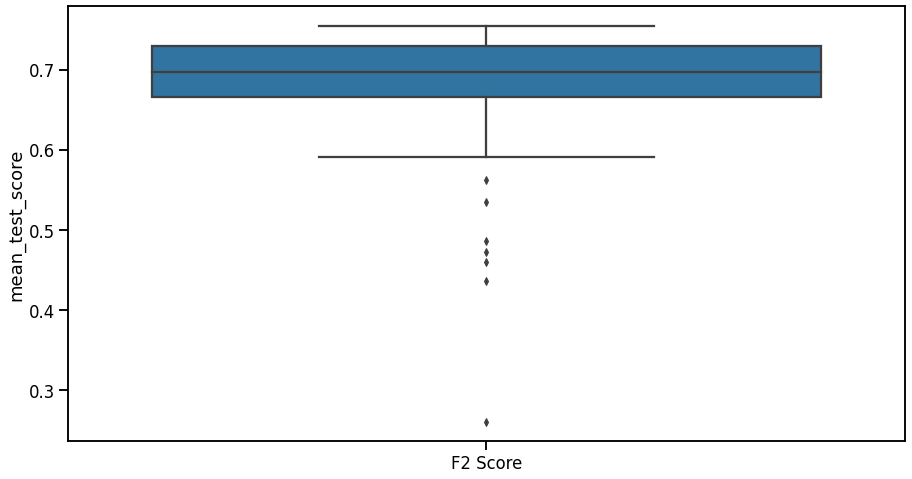

In [63]:
# Boxplots de f2 score en 50-fold cross validation
f2score_metric = kfold_results['mean_test_score']
f2score_label = ['F2 Score']*len(f2score_metric)

sns.set_context('talk')
plt.figure(figsize=(15,8))
sns.boxplot(f2score_label,f2score_metric)

In [62]:
randomcv.best_params_

{'criterion': 'entropy',
 'max_depth': 65,
 'max_features': 'sqrt',
 'min_samples_leaf': 2,
 'splitter': 'best'}

Corrimos nuestro análisis de K-Fold, para optimizar hiperparámetros utilizando dos criterios de scoring y obteniendo los siguientes resultados:

*   fbeta2 scorer:
```
{
 'criterion': 'entropy',
 'max_depth': 65,
 'max_features': 'sqrt',
 'min_samples_leaf': 2,
 'splitter': 'best'
}
```



## h. Graficar Best Tree


### i) Gráfico estandar

[Text(577.4130185488241, 538.9932203389831, 'country_PRT <= 0.5\nentropy = 0.951\nsamples = 95512\nvalue = [60133, 35379]'),
 Text(131.86164713988566, 529.7796610169491, 'customer_type_Transient <= 0.5\nentropy = 0.787\nsamples = 56578\nvalue = [43266, 13312]'),
 Text(38.45592122533135, 520.5661016949152, 'country_IRL <= 0.5\nentropy = 0.218\nsamples = 13036\nvalue = [12582, 454]'),
 Text(34.3080300986905, 511.3525423728814, 'days_in_waiting_list <= 0.5\nentropy = 0.192\nsamples = 12552\nvalue = [12182, 370]'),
 Text(28.889443777132787, 502.13898305084746, 'children <= 0.5\nentropy = 0.2\nsamples = 11877\nvalue = [11508, 369]'),
 Text(19.30971231899303, 492.9254237288136, 'customer_type_Transient-Party <= 0.5\nentropy = 0.182\nsamples = 11496\nvalue = [11179, 317]'),
 Text(9.200366805748875, 483.7118644067797, 'meal_SC <= 0.5\nentropy = 0.011\nsamples = 1996\nvalue = [1994, 2]'),
 Text(8.859365806433438, 474.49830508474577, 'stays_in_week_nights <= 4.5\nentropy = 0.007\nsamples = 1889\

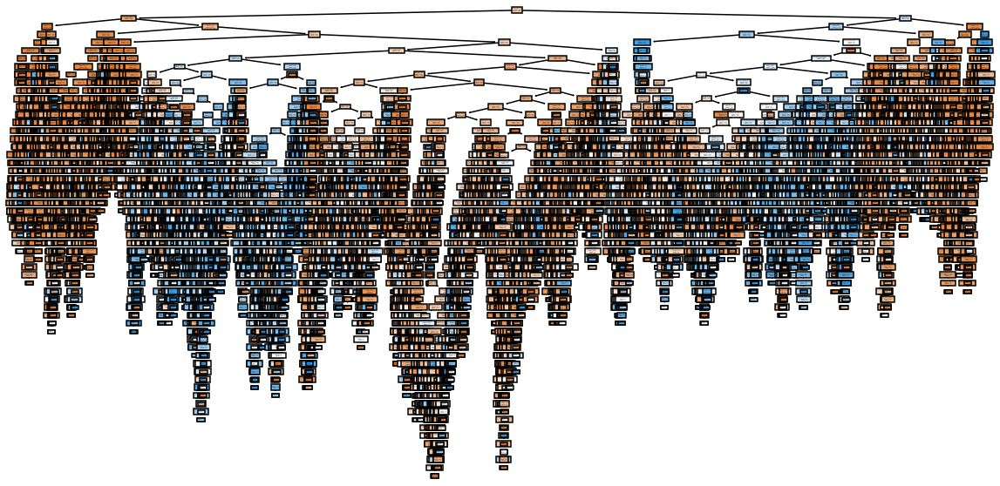

In [64]:
import matplotlib.pyplot as plt

# Tomamos el mejor estimados de nuestro analisis de cross validation
best_tree = randomcv.best_estimator_

#best_tree.fit(x_dev,y_dev)

plt.figure(figsize=(20,10))
plot_tree(
    best_tree,
    feature_names=df_correlations.columns,
    filled=True
)

### ii) Gráfico pydotplus

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.107271 to fit



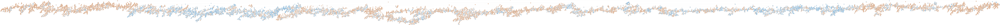

In [65]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(
    best_tree, 
    out_file=dot_data,  
    filled=True, 
    rounded=True,
    special_characters=True
)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### iii) Análisis de Best Tree

In [66]:
# Podemos pedir el árbol correspondiente ya entrenado y ver cuán importante es cada atributo
feat_imps = best_tree.feature_importances_
feat_imps

array([0.10097987, 0.0357123 , 0.02288658, 0.01334608, 0.00601672,
       0.00069898, 0.02424016, 0.01302391, 0.00228789, 0.07480527,
       0.03492717, 0.05143314, 0.01085214, 0.00971715, 0.00894854,
       0.00134543, 0.00338345, 0.02947212, 0.00129953, 0.00769208,
       0.04491075, 0.00508435, 0.00097896, 0.00405112, 0.00298628,
       0.00095917, 0.00065562, 0.1367366 , 0.00307289, 0.0007107 ,
       0.0573691 , 0.00520698, 0.00108047, 0.00159482, 0.00129826,
       0.00159691, 0.00208763, 0.00079578, 0.00308602, 0.00298462,
       0.00314745, 0.00279651, 0.00341127, 0.00060851, 0.00218497,
       0.00123   , 0.0003591 , 0.00065647, 0.11664427, 0.0005415 ,
       0.00089355, 0.00125158, 0.00520564, 0.00707328, 0.00490613,
       0.0042002 , 0.00357681, 0.00629305, 0.00451322, 0.00493957,
       0.00510269, 0.00307761, 0.00539378, 0.00478663, 0.01904581,
       0.05784483])

In [67]:
# Vemos a que variables corresponden los atributos mas importantes
for feat_imp,feat in sorted(zip(feat_imps,features)):
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

country_NOR: 0.00035910423156509274
country_RUS: 0.0005414984210527454
country_ISR: 0.0006085055759348452
is_repeated_guest_1: 0.0006556185289503312
country_POL: 0.0006564709572274469
babies: 0.0006989838742444105
customer_type_Contract: 0.000710697146725531
country_CN: 0.0007957807464168453
country_SWE: 0.0008935491889101638
is_repeated_guest_0: 0.000959171655085551
meal_FB: 0.000978964250371175
country_AUT: 0.0010804716191512187
country_NLD: 0.0012299969319991713
country_USA: 0.0012515838872741052
country_BRA: 0.0012982629864172022
market_segment_Groups: 0.001299526470201064
market_segment_Complementary: 0.0013454349579107995
country_BEL: 0.001594824857963558
country_CHE: 0.0015969101313808543
country_CHN: 0.0020876335081983187
country_ITA: 0.002184971417149047
days_in_waiting_list: 0.002287889792929735
country_GBR: 0.0027965098129451335
country_ESP: 0.002984620289824062
meal_SC: 0.0029862783402983344
deposit_type_Non Refund: 0.003072893695639747
arrival_date_month_November: 0.003077

## i. K-fold y α de poda

In [0]:
x_train_sets = []
x_val_sets = []
y_train_sets = []
y_val_sets = []

# Armo mis splits train-val
for index in range(10):
  x_train, x_val, y_train, y_val = train_test_split(
        x_dev, 
        y_dev, 
        test_size=0.2, 
        random_state=seed,
        stratify=y_dev
    )
  x_train_sets.append(x_train)
  x_val_sets.append(x_val)
  y_train_sets.append(y_train)
  y_val_sets.append(y_val)

# Tree Classifier
ccp_tree = DecisionTreeClassifier(
    criterion='entropy',
    splitter = 'best',
    max_features =  'sqrt',
    max_depth=65,
    min_samples_leaf=2
)

# Calculos los 
ccp_path = ccp_tree.cost_complexity_pruning_path(x_train,y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [0]:
# Vamos a podar nuestra arbol mejor clasificado
clf = randomcv.best_estimator_
path = clf.cost_complexity_pruning_path(x_train,y_train)

ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [0]:
from sklearn.model_selection import StratifiedKFold, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import fbeta_score
import numpy as np

params_grid = {'ccp_alpha':filtered}
scorer_fn = make_scorer(fbeta_score, beta=2)

kfoldcv = StratifiedKFold(n_splits=10)

base_tree = DecisionTreeClassifier(
    random_state=0, 
    criterion = 'entropy',
    max_depth = 28 
)

randomcv = RandomizedSearchCV(
    estimator = base_tree,
    param_distributions = params_grid,
    scoring=scorer_fn,
    cv=kfoldcv,
    n_iter = 10,
    random_state = 50
)
randomcv.fit(x_train,y_train);

## Analizamos metricas K-Fold


In [0]:
from sklearn.metrics import confusion_matrix, classification_report

best_model = randomcv.best_estimator_
y_pred = best_model.predict(x_test)

print(
    classification_report(y_test,y_pred)
)

              precision    recall  f1-score   support

           0       0.88      0.88      0.88     15033
           1       0.79      0.80      0.80      8845

    accuracy                           0.85     23878
   macro avg       0.84      0.84      0.84     23878
weighted avg       0.85      0.85      0.85     23878



Text(19.5, 0.5, 'True')

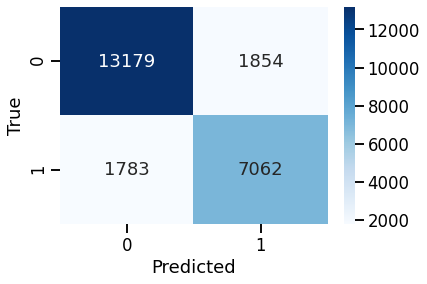

In [0]:
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, cmap='Blues',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:330: MatplotlibDeprecationWarning: Saw kwargs ['c', 'color'] which are all aliases for 'color'.  Kept value from 'color'.  Passing multiple aliases for the same property will raise a TypeError in 3.3.
  ax.plot(x, y, color=color, label=label, **kwargs)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:330: MatplotlibDeprecationWarning: Saw kwargs ['c', 'color'] which are all aliases for 'color'.  Kept value from 'color'.  Passing multiple aliases for the same property will raise a TypeError in 3.3.
  ax.plot(x, y, color=color, label=label, **kwargs)


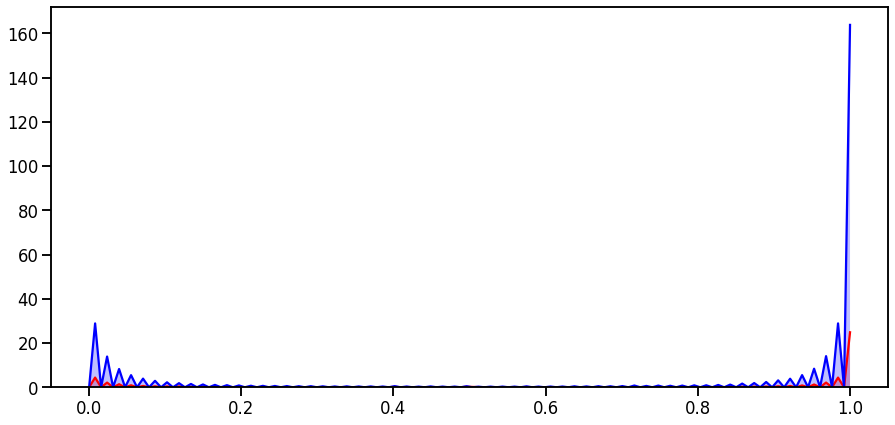

In [0]:
y_scores = best_model.predict_proba(x_test)
out_probs = y_scores[:,1]

plt.figure(figsize=(15,7))
sns.kdeplot(out_probs[y_test==0],shade=True,c='r')
sns.kdeplot(out_probs[y_test==1],shade=True,c='b')

## g. Poda de Arbol

In [0]:
# Vamos a podar nuestra arbol mejor clasificado
clf = randomcv.best_estimator_
path = clf.cost_complexity_pruning_path(x_train,y_train)

ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [0]:
ccp_alphas


array([0.        , 0.        , 0.        , ..., 0.01812787, 0.01831502,
       0.10866758])

In [0]:
impurities

array([0.00930319, 0.00930319, 0.00930319, ..., 0.28448736, 0.35774746,
       0.46641504])

Text(0, 0.5, 'total impurity of leaves')

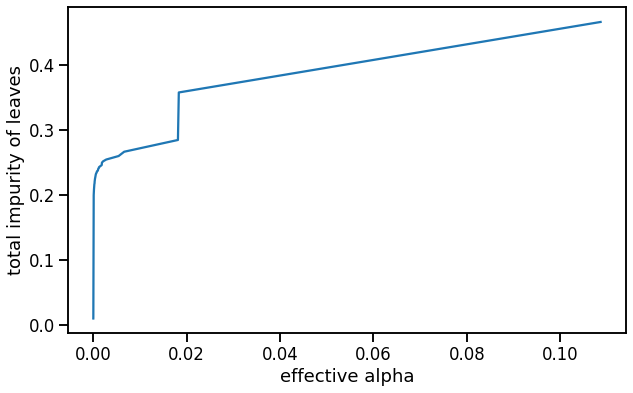

In [0]:
# Graficamos el cost complexity pruning path de nuestro arbol
plt.figure(figsize=(10, 6))
plt.plot(ccp_alphas, impurities)
plt.xlabel("effective alpha")
plt.ylabel("total impurity of leaves")

In [0]:
filter_arr = []

# go through each element in arr
for element in impurities:
  # if the element is completely divisble by 2, set the value to True, otherwise False
  if element > 0.24:
    filter_arr.append(True)
  else:
    filter_arr.append(False)


filtered = ccp_alphas[filter_arr]
print(len(filtered))

14


## i. Alpha K-Fold Validation 

In [0]:
from sklearn.model_selection import StratifiedKFold, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import fbeta_score
import numpy as np

params_grid = {'ccp_alpha':filtered}

kfoldcv = StratifiedKFold(n_splits=10)
base_tree = DecisionTreeClassifier(
    random_state=0, 
    criterion = 'entropy',
    max_depth = 28 
)
scorer_fn = make_scorer(fbeta_score, beta=2)
randomcv = RandomizedSearchCV(
    estimator = base_tree,
    param_distributions = params_grid,
    scoring=scorer_fn,
    cv=kfoldcv,
    n_iter = 10,
    random_state = 50
)
randomcv.fit(x_train,y_train);

In [0]:
# Guardamos los resultados de K-Fold 
prune_kfold = pd.DataFrame(randomcv.cv_results_)
print(len(prune_kfold))
prune_kfold

10


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_ccp_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,1.240388,0.015923,0.006755,0.000112,0.018315,{'ccp_alpha': 0.018315023990871926},0.774068,0.766059,0.778528,0.775358,0.774683,0.781658,0.766397,0.778741,0.772102,0.784570,0.775216,0.005704,1
1,1.234455,0.018214,0.006761,0.000144,0.0066154,{'ccp_alpha': 0.0066154043863585615},0.774068,0.766059,0.778528,0.775358,0.774683,0.781658,0.766397,0.778741,0.772102,0.784570,0.775216,0.005704,1
2,1.260067,0.024903,0.006806,0.000104,0.00542059,{'ccp_alpha': 0.005420585620468585},0.774068,0.766059,0.778528,0.775358,0.774683,0.781658,0.766397,0.778741,0.772102,0.784570,0.775216,0.005704,1
3,1.253161,0.006653,0.006858,0.000177,0.00146567,{'ccp_alpha': 0.0014656697042258887},0.772801,0.724592,0.777057,0.717153,0.747241,0.739271,0.689858,0.713457,0.769729,0.772344,0.742350,0.028905,5
4,1.242069,0.023379,0.006795,0.000133,0.00121746,{'ccp_alpha': 0.0012174582100064474},0.729660,0.726565,0.727473,0.739949,0.738630,0.740986,0.717980,0.729780,0.732172,0.724911,0.730810,0.006936,6
5,1.234883,0.024768,0.006734,0.000105,0.00209293,{'ccp_alpha': 0.002092927966462592},0.697335,0.695711,0.701369,0.702063,0.707498,0.711039,0.688614,0.698585,0.702057,0.698396,0.700267,0.005894,10
6,1.218990,0.016125,0.006716,0.000100,0.00275969,{'ccp_alpha': 0.002759690931199786},0.773484,0.764650,0.778966,0.776103,0.773773,0.783411,0.767422,0.699305,0.771293,0.784215,0.767262,0.023422,4
7,1.230827,0.017612,0.006801,0.000282,0.00181693,{'ccp_alpha': 0.0018169274904004107},0.711052,0.711967,0.714286,0.717153,0.723407,0.725191,0.704475,0.713457,0.716068,0.711167,0.714822,0.005772,7
8,1.254244,0.009580,0.006748,0.000122,0.00184403,{'ccp_alpha': 0.001844032657149039},0.711052,0.711967,0.714286,0.702063,0.723407,0.725191,0.688178,0.713457,0.716068,0.711167,0.711683,0.009974,9
9,1.258240,0.009360,0.007014,0.000798,0.00180023,{'ccp_alpha': 0.0018002286773838583},0.711052,0.711967,0.714286,0.717153,0.723407,0.725191,0.704475,0.713457,0.716068,0.711167,0.714822,0.005772,7


In [0]:
for clf in :


SyntaxError: ignored

In [0]:
randomcv.best_params_

In [0]:
filtered

In [0]:
# Vamos a buscar el valor óptimo de alpha para nuestro arbol
clfs = []

for ccp_alpha in filtered:
    clf = DecisionTreeClassifier(
        random_state=0, 
        ccp_alpha=ccp_alpha,
        criterion = 'entropy',
        max_depth = 28
    )
    clf.fit(x_train, y_train)
    clfs.append(clf)

In [0]:
# Graficamos la relación entre alpha y la profundidad de nuestro arbol

tree_depths = [clf.tree_.max_depth for clf in clfs]
plt.figure(figsize=(10,  6))
plt.plot(filtered[:-1], tree_depths[:-1])
plt.xlabel("effective alpha")
plt.ylabel("total depth")

In [0]:
# Graficamos el alpha que mejora nuestro fbeta score
from sklearn.metrics import fbeta_score

fbeta2_scores = [fbeta_score(y_test, clf.predict(x_test), beta=2) for clf in clfs]

tree_depths = [clf.tree_.max_depth for clf in clfs]
plt.figure(figsize=(10,  6))
plt.grid()
plt.plot(filtered[:-1], fbeta2_scores[:-1])
plt.xlabel("effective alpha")
plt.ylabel("FBeta2 scores")

##j. Comparar alpha y arbol sin poda

Armar dos arboles con alpha distintos (apha elegido y alpha 0), entrenarlos y comparar la validacion


In [0]:
x_train_, x_val_, y_train_, y_val_ = train_test_split(
      x_train, 
      y_train, 
      test_size=0.2, 
      random_state=seed,
      stratify=y_train
)

